<a href="https://colab.research.google.com/github/coronarita1991/AIFFEL_RESEARCH_STUDY/blob/main/Ablation_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
from __future__ import division

import six
from keras.models import Model
from keras.layers import (
    Input,
    Activation,
    Dense,
    Flatten
)
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D
)
from keras.layers import Add
from keras.layers import BatchNormalization
from keras.regularizers import l2
from keras import backend as K

# 프로젝트 루브릭 및 CIFAR-10 datasets 가져오기

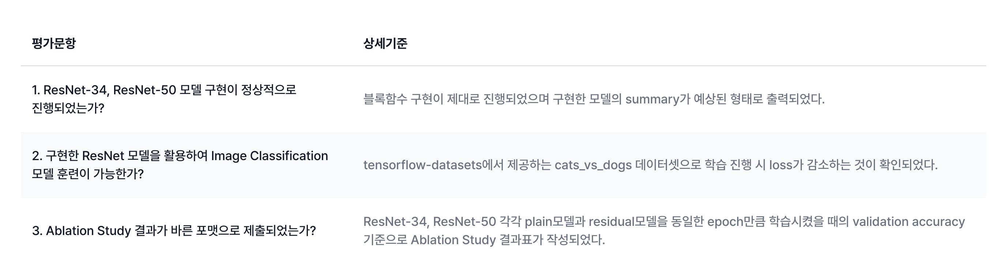

In [8]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds
print(tf.__version__)
print(np.__version__)

2.6.0
1.21.4


In [9]:
# Tensorflow가 활용할 GPU가 장착되어 있는지 확인해 봅니다.
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
import urllib3
urllib3.disable_warnings()

 # 데이터셋 다운로드의 프로그레스 바가 나타나지 않게 합니다.
# tfds.disable_progress_bar()

(ds_train, ds_test), ds_info = tfds.load(
    'cifar10',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

In [5]:
# Tensorflow dataset에 대한 feature 확인
print(ds_info.features)

FeaturesDict({
    'id': Text(shape=(), dtype=tf.string),
    'image': Image(shape=(32, 32, 3), dtype=tf.uint8),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=10),
})


In [6]:
# 데이터 수 확인 - numpy가 아니기 때문에, .shape 호출은 불가능
print(tf.data.experimental.cardinality(ds_train))
print(tf.data.experimental.cardinality(ds_test))

tf.Tensor(50000, shape=(), dtype=int64)
tf.Tensor(10000, shape=(), dtype=int64)


In [52]:
# 정규화 진행
def normalize_and_resize_img(image, label):
    """Normalizes images: `uint8` -> `float32`."""

    # Resize
    print(image)
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (224, 224))

    # Normalize
    image /= 255.0

    return image, label

In [53]:
print(type(ds_train))
print(type(ds_test))

<class 'tensorflow.python.data.ops.dataset_ops.PrefetchDataset'>
<class 'tensorflow.python.data.ops.dataset_ops.PrefetchDataset'>


In [54]:
def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    # apply normalize
    ds = ds.map(
        normalize_and_resize_img,
        num_parallel_calls=1
    )
    # make batch
    ds = ds.batch(batch_size)

    if not is_test:
        ds = ds.repeat() # 정확하게 이해하지는 못했음. 아마 매학습마다 반복을 해주는데
        ds = ds.shuffle(200) # shuffle을 두어서 미리 담아둘수 있는 공간을 확보

    ds = ds.prefetch(tf.data.experimental.AUTOTUNE) # 미리 최적 배치들을 준비하게 함

    return ds

In [10]:
ds_info.features['label'].num_classes

10

In [11]:
ds_info.features['label'].names

['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

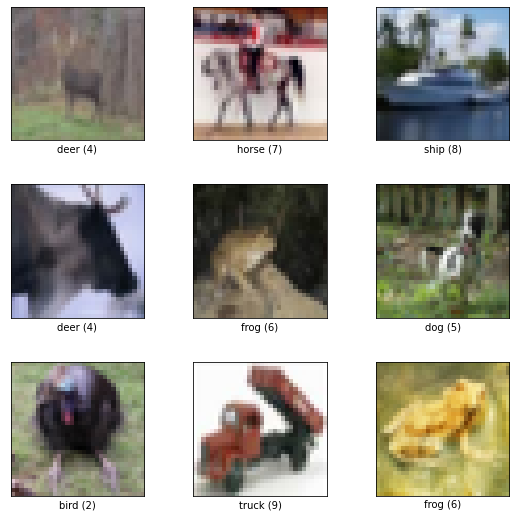

In [12]:
# 데이터 예시 보기
fig = tfds.show_examples(ds_train, ds_info)

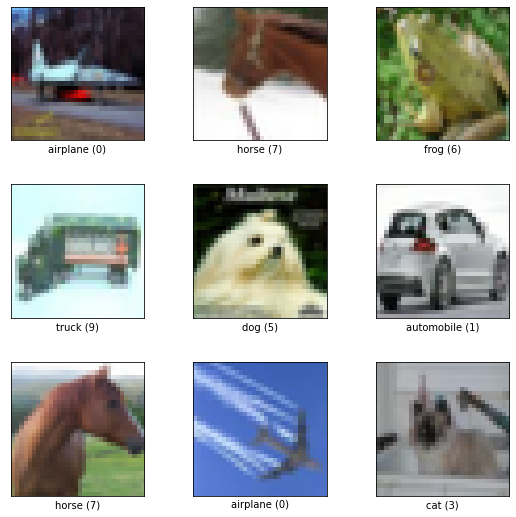

In [13]:
fig = tfds.show_examples(ds_test, ds_info)

# 1) ResNet 기본 블록 구성하기

- 이제 실전으로 돌아와서 ResNet-34와 ResNet-50 네트워크를 직접 만든다고 생각해 봅시다.
- 우선 ResNet-34와 ResNet-50에서 사용되는 블록의 공통점을 찾고 차이점을 찾아봅시다.

    [Deep Residual Learning for Image Recognition(paper)](https://arxiv.org/pdf/1512.03385.pdf)

    [빛과 같은 카이밍허님의 깃헙](https://github.com/KaimingHe/deep-residual-networks)




### ***공통점***

- conv_1, 2, 3, 4, 5의 수, 그리고 이후 average pooling, softmax등의 구조가 유사하다.

### ***차이점***
- layer 수가 다른데, 16개의 레이어가 차이가 나며, 단위 모듈에 구성된 부분에 앞, 뒤에 각각 1x1의 convolution이 추가되어 있다.

# 2) ResNet-34, ResNet-50 Complete Model

ResNet 모델 구현 시 Sequential API나 Subclass API를 사용한다면, 그 과정에서 모델 단위로 기존의 코드를 재활용했을 때 model.summary() 호출 시 서브모델 내부의 레이어 구성이 생략되고 서브모델 단위로만 출력될 우려가 있습니다. 모델 구성만을 위해서는 그런 방법도 무방하지만, 가급적 이번 실습에서는 VGG 실습 예시에서처럼 Functional API 를 구성하는 방식을 사용할 것을 권합니다.

해당 코드를 일부 참고하였습니다.

https://github.com/raghakot/keras-resnet/blob/master/resnet.py


In [10]:


def _bn_relu(input):
    """Helper to build a BN -> relu block
    """
    norm = BatchNormalization(axis=CHANNEL_AXIS)(input)
    return Activation("relu")(norm)


def _conv_bn_relu(**conv_params):
    """Helper to build a conv -> BN -> relu block
    """
    filters = conv_params["filters"]
    kernel_size = conv_params["kernel_size"]
    strides = conv_params.setdefault("strides", (1, 1))
    kernel_initializer = conv_params.setdefault("kernel_initializer", "he_normal")
    padding = conv_params.setdefault("padding", "same")
    kernel_regularizer = conv_params.setdefault("kernel_regularizer", l2(1.e-4))

    def f(input):
        conv = Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer)(input)
        return _bn_relu(conv)

    return f


def _bn_relu_conv(**conv_params):
    """Helper to build a BN -> relu -> conv block.
    This is an improved scheme proposed in http://arxiv.org/pdf/1603.05027v2.pdf
    """
    filters = conv_params["filters"]
    kernel_size = conv_params["kernel_size"]
    strides = conv_params.setdefault("strides", (1, 1))
    kernel_initializer = conv_params.setdefault("kernel_initializer", "he_normal")
    padding = conv_params.setdefault("padding", "same")
    kernel_regularizer = conv_params.setdefault("kernel_regularizer", l2(1.e-4))

    def f(input):
        activation = _bn_relu(input)
        return Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer)(activation)

    return f


def _shortcut(input, residual):
    """Adds a shortcut between input and residual block and merges them with "sum"
    """
    # Expand channels of shortcut to match residual.
    # Stride appropriately to match residual (width, height)
    # Should be int if network architecture is correctly configured.
    input_shape = K.int_shape(input)
    residual_shape = K.int_shape(residual)
    stride_width = int(round(input_shape[ROW_AXIS] / residual_shape[ROW_AXIS]))
    stride_height = int(round(input_shape[COL_AXIS] / residual_shape[COL_AXIS]))
    equal_channels = input_shape[CHANNEL_AXIS] == residual_shape[CHANNEL_AXIS]

    shortcut = input

    # # for debugging
    # print(input_shape, residual_shape) # (None, 8, 8, 64) (None, 4, 4, 128)
    # print(input_shape[COL_AXIS], residual_shape[COL_AXIS]) # 64, 128

    # # It means the Axis not selected appropriately.

    # print(stride_width, stride_height, equal_channels) # Error with the value : 2 0 False
    # # why the 'stride_height' get the value '0'.



    # 1 X 1 conv if shape is different. Else identity.
    if stride_width > 1 or stride_height > 1 or not equal_channels:
        shortcut = Conv2D(filters=residual_shape[CHANNEL_AXIS],
                          kernel_size=(1, 1),
                          strides=(stride_width, stride_height),
                          padding="valid",
                          kernel_initializer="he_normal",
                          kernel_regularizer=l2(0.0001))(input)

    return Add()([shortcut, residual])


def _residual_block(block_function, is_resnet, conv_first, filters, repetitions, is_first_layer=False):
    """Builds a residual block with repeating bottleneck blocks.
    """
    def f(input):
        for i in range(repetitions):
            init_strides = (1, 1)
            if i == 0 and not is_first_layer:
                init_strides = (2, 2) # downsampling for others without first layer

            input = block_function(is_resnet, conv_first, filters=filters, init_strides=init_strides,
                                   is_first_block_of_first_layer=(is_first_layer and i == 0))(input)
        return input

    return f


# for Resnet <50
def basic_block(is_resnet, conv_first, filters, init_strides=(1, 1), is_first_block_of_first_layer=False):
    """Basic 3 X 3 convolution blocks for use on resnets with layers <= 34.
    Follows improved proposed scheme in http://arxiv.org/pdf/1603.05027v2.pdf
    """

    # original(conv_first=True) : (conv - BN - relu - conv - BN + Residual) Relu
    # proposed(conv_first=False) : BN - relu - conv * 2 + Residual

    def f(input):
        if not conv_first : # Originally implemented by original
            if is_first_block_of_first_layer:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv1 = Conv2D(filters=filters, kernel_size=(3, 3),
                            strides=init_strides,
                            padding="same",
                            kernel_initializer="he_normal",
                            kernel_regularizer=l2(1e-4))(input)
            else:
                conv1 = _bn_relu_conv(filters=filters, kernel_size=(3, 3),
                                    strides=init_strides)(input)

            residual = _bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv1)

            if is_resnet:
                return _shortcut(input, residual)

            else :
                return residual

        else : # Actual code I modified

            # conv_first
            # original(conv_first=True) : (conv - BN - relu - conv - BN + Residual) Relu
            # at last layer - we need to do Residual Connection(_shortcut)

            conv1  = _conv_bn_relu(filters=filters, kernel_size=(3, 3),
                                strides=init_strides)(input)

            conv2 = Conv2D(filters=filters, kernel_size=(3, 3),
                        strides=(1, 1), # Modify not to downsample
                        padding="same",
                        kernel_initializer="he_normal",
                        kernel_regularizer=l2(1e-4))(conv1)

            residual = BatchNormalization(axis=CHANNEL_AXIS)(conv2)

            if is_resnet:
                return Activation("relu")(_shortcut(input, residual))

            else :
                return Activation("relu")(residual)

    return f

# for Resnet >=50
def bottleneck(is_resnet, conv_first, filters, init_strides=(1, 1), is_first_block_of_first_layer=False):
    """Bottleneck architecture for > 34 layer resnet.
    Follows improved proposed scheme in http://arxiv.org/pdf/1603.05027v2.pdf

    Returns:
        A final conv layer of filters * 4
    """


    def f(input):
        if not conv_first :
            if is_first_block_of_first_layer:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                                strides=init_strides,
                                padding="same",
                                kernel_initializer="he_normal",
                                kernel_regularizer=l2(1e-4))(input)
            else:
                conv_1_1 = _bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                        strides=init_strides)(input)

            conv_3_3 = _bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
            residual = _bn_relu_conv(filters=filters * 4, kernel_size=(1, 1))(conv_3_3)

            if is_resnet:
                return _shortcut(input, residual)

            else :
                return residual

        else : # Actual code I modified

            # conv_first
            # original(conv_first=True) : (conv - BN - relu - conv - BN - relu - conv - BN + Residual) Relu
            # at last layer - we need to do Residual Connection(_shortcut)

            conv1  = _conv_bn_relu(filters=filters, kernel_size=(1, 1),
                                strides=init_strides)(input)

            conv2 = _conv_bn_relu(filters=filters, kernel_size=(3, 3),
                                strides=init_strides)(conv1)

            conv3 = Conv2D(filters=filters, kernel_size=(1, 1),
                        strides=(1, 1), # Modify not to downsample
                        padding="same",
                        kernel_initializer="he_normal",
                        kernel_regularizer=l2(1e-4))(conv2)

            residual = BatchNormalization(axis=CHANNEL_AXIS)(conv3)

            if is_resnet:
                return Activation("relu")(_shortcut(input, residual))

            else :
                return Activation("relu")(residual)


    return f



def _handle_dim_ordering():
    global ROW_AXIS
    global COL_AXIS
    global CHANNEL_AXIS

    # print(K.image_data_format()) # channel_last

    if K.image_data_format() == 'tf': # channel First
        # print("Selected tf")
        CHANNEL_AXIS = 1
        ROW_AXIS = 2
        COL_AXIS = 3

    else: # channel_last
        # print("Selected other")
        ROW_AXIS = 1
        COL_AXIS = 2
        CHANNEL_AXIS = 3



def _get_block(identifier):
    if isinstance(identifier, six.string_types):
        res = globals().get(identifier)
        if not res:
            raise ValueError('Invalid {}'.format(identifier))
        return res
    return identifier


class ResnetBuilder(object):
    @staticmethod
    def build(input_shape, num_outputs, block_fn, repetitions, is_resnet, conv_first):
        """Builds a custom ResNet like architecture.

        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved

        Returns:
            The keras `Model`.
        """
        _handle_dim_ordering()
        if len(input_shape) != 3:
            raise Exception("Input shape should be a tuple (nb_channels, nb_rows, nb_cols)")

        # Permute dimension order if necessary
        if K.image_data_format() == 'tf':
            input_shape = (input_shape[1], input_shape[2], input_shape[0])

        # Load function from str if needed.
        block_fn = _get_block(block_fn)

        input = Input(shape=input_shape)
        conv1 = _conv_bn_relu(filters=64, kernel_size=(7, 7), strides=(2, 2))(input)
        pool1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same")(conv1)

        block = pool1
        filters = 64

        # print(is_resnet)

        for i, r in enumerate(repetitions):
            block = _residual_block(block_function=block_fn, is_resnet=is_resnet, conv_first=conv_first,
                                    filters=filters, repetitions=r, is_first_layer=(i == 0))(block)

            # TypeError: _residual_block.<locals>.f() missing 1 required positional argument: 'is_resnet'

            filters *= 2

        # Last activation
        block = _bn_relu(block) if not conv_first else block

        # Classifier block
        block_shape = K.int_shape(block)
        pool2 = AveragePooling2D(pool_size=(block_shape[ROW_AXIS], block_shape[COL_AXIS]),
                                 strides=(1, 1))(block)
        flatten1 = Flatten()(pool2)

        dense = Dense(units=1000, kernel_initializer="he_normal",
                      activation="relu",
                      name="fc1000"
                      )(flatten1)

        dense = Dense(units=num_outputs, kernel_initializer="he_normal",
                      activation="softmax" if num_outputs > 2 else "sigmoid",
                      name = "classifier"
                      )(dense)

        model = Model(inputs=input, outputs=dense)
        return model

    @staticmethod
    def build_resnet_18(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, basic_block, [2, 2, 2, 2])

    @staticmethod
    def build_resnet_34(input_shape, num_outputs, is_resnet=True, conv_first=True):
        return ResnetBuilder.build(input_shape, num_outputs, basic_block, [3, 4, 6, 3], is_resnet, conv_first)

    @staticmethod
    def build_resnet_50(input_shape, num_outputs, is_resnet=True, conv_first=True):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 4, 6, 3], is_resnet, conv_first)

    @staticmethod
    def build_resnet_101(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 4, 23, 3])

    @staticmethod
    def build_resnet_152(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 8, 36, 3])

## ResNet-34

- VGG와 같이 블록을 만드는 함수를 사용해서 직접 전체 모델을 만들어 봅시다. ResNet-34와 ResNet-50의 차이에 따라 달라지는 구성(configuration)을 함수에 전달해서 같은 생성 함수 build_resnet()를 통해서 ResNet의 여러 가지 버전들을 모두 만들어 낼 수 있도록 해야 합니다.

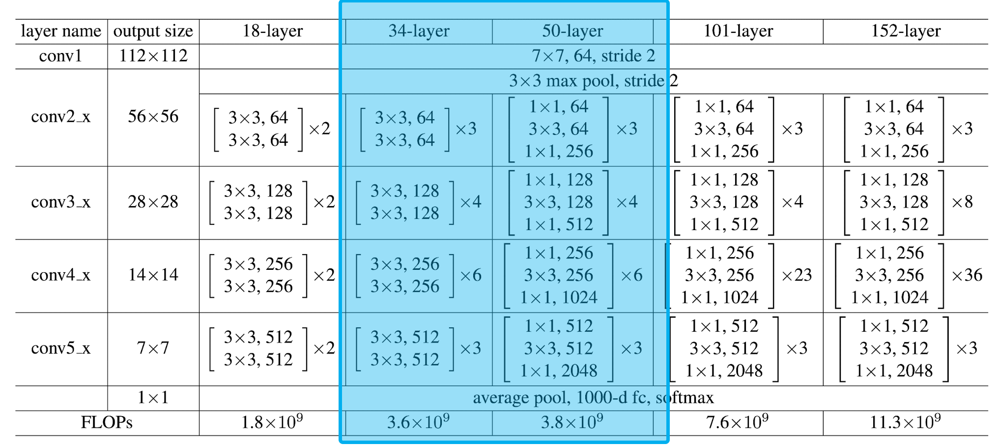

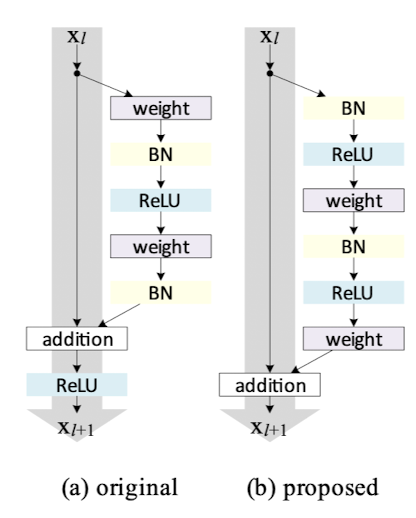

- Original 모델의 Residual block - (a)참조

In [11]:
# def conv1_block(x):
#     '''
#     first layer - 7 x 7, 64, stride 2
#     '''

#     x = keras.layers.Conv2D(
#         filters=64,
#         kernel_size=(7, 7),
#         strides=(2, 2),
#         activation='relu',
#         kernel_initializer='he_normal',
#         padding='same',
#         name='conv1')(x)

#     # batch normalization
#     x = keras.layers.BatchNormalization(name='bn1')(x)
#     # activation
#     x = keras.layers.Activation('relu', name='activation1')(x)

#     return x

In [12]:
# # for testing conv1_block

# input_shape=(32, 32, 3)
# input_layer = keras.layers.Input(shape=input_shape, name='input_layer')
# output = conv1_block(input_layer)


# model = keras.Model(
#         inputs=input_layer,
#         outputs=output
#         )
# model.summary()

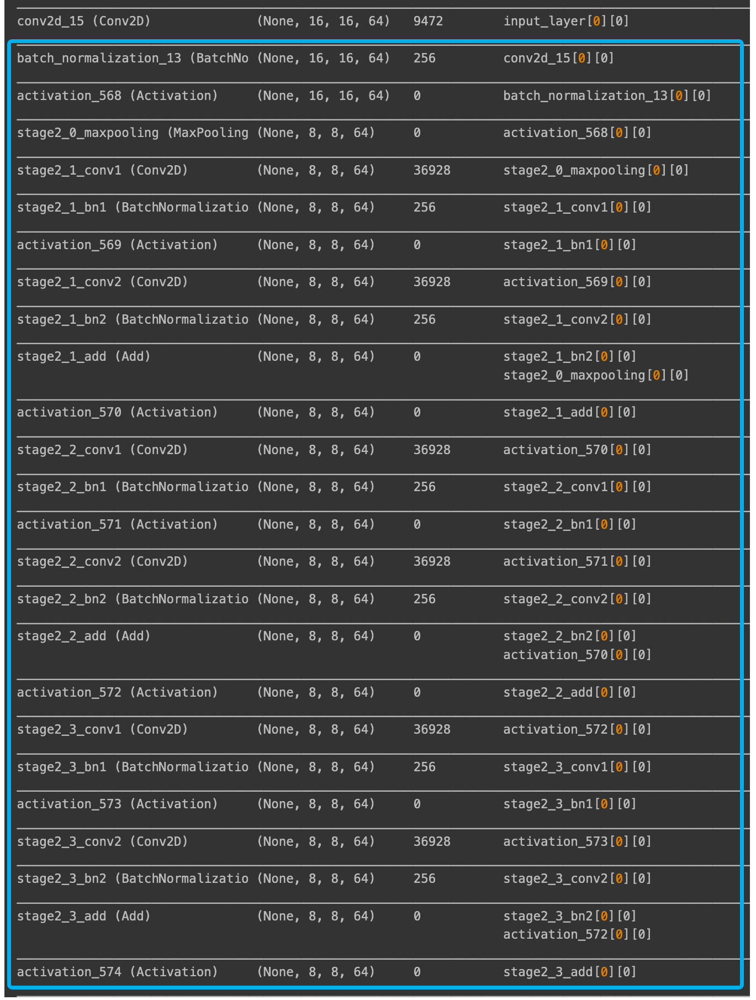

- 개별 흐름 :
- ( conv - bn - activation ) x 2 @ Resnet34,
- ( conv - bn - activation ) x 3 @ Resnet50,

# **시간이 유한한 관계로 직접 구현이 생각보다 잘 되지않아, 기존 구현된 것을 가져와서 이해하는 것에 집중했습니다. 여유가 되면 제 구현으로 다시 변경예정입니다. **

In [13]:
# # Func for bottleneck
# def build_bottleneck(input_layer,
#                     num_cnn=3,
#                     channel=64,
#                     block_num=2,
#                     is_50=False,
#                     is_resnet=False,
#                     ):
#     # Input
#     x = input_layer

#     # Convolution
#     for cnn_num in range(num_cnn):

#         # setting of shortcut
#         if is_resnet:
#             shortcut = x

#             if x.shape[-1] != channel * (3 if is_50 else 1):
#                 shortcut = keras.layers.Conv2D(
#                     filters=channel * (3 if is_50 else 1),
#                     kernel_size=(1, 1),
#                     strides=(2, 2) if cnn_num == 0 and block_num != 2 else (1, 1),
#                     kernel_initializer='he_normal',
#                     padding='same',
#                     name=f'block{block_num}_{cnn_num+1}_conv_shortcut'
#                 )(shortcut)
#                 shortcut = keras.layers.BatchNormalization(
#                     name=f'block{block_num}_{cnn_num+1}_bn_shortcut'
#                 )(shortcut)

#         if is_50:
#             channel_ratio_list = [1, 1, 3]
#             kernel_size_list = [(1, 1), (3, 3), (1, 1)]

#             for i, (channel_ratio, kernel_size) in enumerate(zip(channel_ratio_list, kernel_size_list), start=1):
#                 # Conv
#                 x = keras.layers.Conv2D(
#                     filters=channel * channel_ratio,
#                     kernel_size=kernel_size,
#                     strides=(2, 2) if i == 1 and block_num!=2 else (1, 1),
#                     kernel_initializer='he_normal',
#                     padding='same',
#                     name=f'block{block_num}_{cnn_num+1}_conv{i}'
#                 )(x)

#                 # BN
#                 x = keras.layers.BatchNormalization(
#                     name=f'block{block_num}_{cnn_num+1}_bn{i}'
#                 )(x)

#                 # Relu
#                 x = keras.layers.Activation('relu')(x)
#                 if is_resnet:
#                     # Resnet일 때,

#                     t을 여기서 합쳐서 마지막 relu를 해줘야 한다.
#                     x = keras.layers.Add()([x, shortcut])
#                     # Relu
#                     x = keras.layers.Activation('relu')(x)

#         else : # 34
#             for i in range(1, 3):
#                 x = keras.layers.Conv2D(
#                     filters=channel,
#                     kernel_size=(3, 3),
#                     strides=(2, 2) if i == 1 and block_num!=2 else (1, 1),
#                     kernel_initializer='he_normal', #
#                     padding='same',
#                     name=f'block{block_num}_{cnn_num+1}_conv{i}'
#                 )(x)

#                 # BN
#                 x = keras.layers.BatchNormalization(
#                     name=f'block{block_num}_{cnn_num+1}_bn{i}'
#                 )(x)

#                 # Relu
#                 x = keras.layers.Activation('relu')(x)

#                 if is_resnet:
#                     print(x.shape, shortcut.shape)
#                     # Resnet일 때, shortcut을 여기서 합쳐서 마지막 relu를 해줘야 한다.
#                     x = keras.layers.Add()([x, shortcut])
#                     # Relu
#                     x = keras.layers.Activation('relu')(x)



#     return x


진행 중임

In [14]:
# # Resnet 생성하는 함수

# def build_resnet(input_shape=(32, 32, 3),
#               num_cnn_list=[3,4,6,3],
#               channel_list=[64,128,256,512],
#               # num_cnn_list, channel_list config list으로 추정
#               num_classes=10,
#                 is_50=False,
#                  is_resnet=True):

#     assert len(num_cnn_list) == len(channel_list) # 모델 생성 전 일치 여부를 체크

#     input_layer = keras.layers.Input(shape=input_shape)
#     output = input_layer

#     # 첫번째 레이어를 통과
#     output = conv1_block(output)

#     # config list들의 길이만큼 반복해서 블록을 생성합니다.
#     # - conv2_x to conv5_x에 해당
#     for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list), start=2):

#         if i == 2 :
#             # MaxPooling
#             output = keras.layers.MaxPooling2D(
#                 pool_size=(2, 2),
#                 strides=(2, 2),
#                 name=f'block{i}_pooling'
#             )(output)

#         output = build_bottleneck(
#             output,
#             num_cnn=num_cnn,
#             channel=channel,
#             block_num=i,
#             is_50=is_50,
#             is_resnet=is_resnet,
#         )

#     # for average pooling
#     output = keras.layers.GlobalAveragePooling2D(name='avg_pooling')(output)

#     # for classifier
#     output = keras.layers.Flatten(name='flatten')(output)
#     output = keras.layers.Dense(1000, activation='relu', name='fc1000')(output)
#     output = keras.layers.Dense(num_classes, activation='softmax',
#                                 name='classifier')(output)

#     model = keras.Model(
#         inputs=input_layer,
#         outputs=output
#         )

#     return model



In [ ]:
INPUT_SHAPE = (32, 32, 3)

In [15]:
resnet_34 = ResnetBuilder.build_resnet_34(INPUT_SHAPE, 1)
resnet_34.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 16, 16, 64)   9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 16, 16, 64)   256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 16, 16, 64)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

## ResNet-50

위에서 만든 함수에 config를 조절해서 ResNet-50을 만들어 봅니다. 구조가 원하는 대로 만들어졌는지 확인하고 이상이 있다면 수정합니다.

In [16]:
resnet_50 = ResnetBuilder.build_resnet_50(INPUT_SHAPE, 1)
resnet_50.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_36 (Conv2D)              (None, 16, 16, 64)   9472        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_33 (BatchNo (None, 16, 16, 64)   256         conv2d_36[0][0]                  
__________________________________________________________________________________________________
activation_33 (Activation)      (None, 16, 16, 64)   0           batch_normalization_33[0][0]     
____________________________________________________________________________________________

ResNet-50은 구현마다 약간씩 다르게 나올 수 있습니다. 왜냐하면 Residual 블록의 Batch Normalization과 ReLU 레이어의 위치가 논문에 명시되지 않았기 때문이죠!

하지만 ResNet을 고안한 4인방은 이에 대해 또 한번 논문을 씁니다. Residual 블록에 대해서 자세하게 씁니다. 이 논문을 읽어보면 오리지널 ResNet-50에 대한 힌트가 약.간. 있을 수도 있습니다~!

[Identity Mappings in Deep Residual Networks](https://arxiv.org/pdf/1603.05027.pdf)


# 3) 일반 네트워크(plain network) 만들기
## 블록 코드 수정하기

우리는 앞에서 ResNet 모델을 구현했습니다. ResNet의 핵심 아이디어는 skip connection과 residual network기 때문에, ResNet의 효과를 보여주기 위해서는 skip connection이 없는 일반 네트워크(plain net)가 필요합니다. 위에서 ResNet 블록을 만들기 위한 함수를 그대로 활용해서 skip connection이 없는 블록을 만들 수 있도록 기능을 추가해 주세요!

In [17]:
# 해당 부분은 최상단 클래스단에서 수정했습니다.


## 전체 함수 코드 수정하기

이제 위에서 만든 블록 함수를 토대로 전체 네트워크를 만들 수 있도록 전체 네트워크 코드를 수정합시다. ResNet-50과 ResNet-34, 그리고 같은 레이어를 가지지만 skip connection이 없는 PlainNet-50과 PlainNet-34를 만들 수 있는 함수 build_plainnet()를 만들어 보세요. 이때 입력 이미지의 크기는 (224, 224, 3)으로 해주세요.


In [18]:
plainnet_34 = ResnetBuilder.build_resnet_34(INPUT_SHAPE, 1, is_resnet=False)
plainnet_34.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 16, 16, 64)        9472      
_________________________________________________________________
batch_normalization_82 (Batc (None, 16, 16, 64)        256       
_________________________________________________________________
activation_82 (Activation)   (None, 16, 16, 64)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 8, 8, 64)          36928     
_________________________________________________________________
batch_normalization_83 (Batc (None, 8, 8, 64)          256 

In [26]:
plainnet_50 = ResnetBuilder.build_resnet_50(INPUT_SHAPE, 1, is_resnet=False)
plainnet_50.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_121 (Conv2D)          (None, 16, 16, 64)        9472      
_________________________________________________________________
batch_normalization_115 (Bat (None, 16, 16, 64)        256       
_________________________________________________________________
activation_115 (Activation)  (None, 16, 16, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_122 (Conv2D)          (None, 8, 8, 64)          4160      
_________________________________________________________________
batch_normalization_116 (Bat (None, 8, 8, 64)          256 

# 4) ResNet-50 vs Plain-50 또는 ResNet-34 vs Plain-34
### Ablation Study

이제 VGG-16, 19 예제와 같이 ResNet-50 vs Plain-50 또는 ResNet-34 vs Plain-34에 대해서 학습을 진행해 봅니다. 그리고 결과를 비교해 봅시다! ResNet은 많은 레이어와 Pooling을 거치므로 CIFAR-10에서는 오버피팅(overfitting)으로 잘 동작하지 않을 수 있습니다. 레이어가 많고 학습해야 할 변수(parameter)가 많은 데 비해, 데이터 수가 많지 않기 때문이지요. 224x224 픽셀 크기의 데이터셋을 찾아서 실험해 보도록 합시다. 학습은 끝까지 시키기엔 시간이 없으니 확인을 위한 정도의 epoch로 설정해 주세요.

어떤 데이터셋을 사용하셔도 무방하지만, 얼른 떠오르는 것이 없다면 tensorflow-datasets에서 제공하는 cats_vs_dogs 데이터셋을 추천합니다. 아마 이 데이터셋도 다루어 보신 적이 있을 것입니다. Tensorflow에서 제공하는 데이터셋이므로 오늘 VGG 학습에 사용했던 CIFAR-10을 로딩하는 것과 같은 방법으로 활용하실 수 있습니다.

혹시 에러가 발생했나요? 그렇다면 다음의 링크를 읽어보세요

[tensorflow_datasets.load('cats_vs_dogs') not working !](https://github.com/tensorflow/datasets/issues/3918)

어떤 에러가 발생했을까요?

In [24]:
setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

(ds_train, ds_valid, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]','train[80%:90%]', 'train[90%:]'],
    as_supervised=True,
    shuffle_files=True,
    with_info=True,
)


In [25]:
ds_info

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='/aiffel/tensorflow_datasets/cats_vs_dogs/4.0.0',
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    t

### 학습을 돌려보니, 정상적이지못한 이미지셋들이 다수 발견됨(Corrupted Data)

In [26]:
!pwd

/aiffel/aiffel/AIFFEL_RESEARCH_STUDY/Quests/Quest8_20240701


In [27]:
import os
home_path = os.path.expanduser("~")

print(home_path)

/aiffel


In [28]:
directory_path = os.path.join(home_path, 'tensorflow_datasets/cats_vs_dogs/4.0.0')
print(directory_path)

/aiffel/tensorflow_datasets/cats_vs_dogs/4.0.0


In [29]:
file_list = os.listdir(directory_path)

In [30]:
# 파일 경로와 함께 출력
file_paths = [os.path.join(directory_path, filename) for filename in file_list]
test_path = file_paths[0]

In [31]:
def print_tfrecord_structure(tfrecord_file):
    raw_dataset = tf.data.TFRecordDataset(tfrecord_file)
    for raw_record in raw_dataset.take(1):
        example = tf.train.Example()
        example.ParseFromString(raw_record.numpy())
        print(example)
        
print_tfrecord_structure(test_path)

features {
  feature {
    key: "image"
    value {
      bytes_list {
        value: "\377\330\377\340\000\020JFIF\000\001\001\001\000H\000H\000\000\377\341\010\230Exif\000\000II*\000\010\000\000\000\023\000\016\001\002\000 \000\000\000\362\000\000\000\017\001\002\000\005\000\000\000\022\001\000\000\020\001\002\000\010\000\000\000\030\001\000\000\022\001\003\000\001\000\000\000\001\000\000\000(\001\003\000\001\000\000\000\002\000\000\0002\001\002\000\024\000\000\000 \001\000\000\023\002\003\000\001\000\000\000\002\000\000\000FG\003\000\001\000\000\000\000\000\000\000i\207\004\000\001\000\000\000P\001\000\000\233\234\001\000\002\000\000\000\000\000\000\000\234\234\001\000\002\000\000\000\000\000\000\000\235\234\001\000\002\000\000\000\000\000\000\000\236\234\001\000\002\000\000\000\000\000\000\000\237\234\001\000\002\000\000\000\000\000\000\000\001\244\003\000\001\000\000\000\000\000\000\000\002\244\003\000\001\000\000\000\000\000\000\000\003\244\003\000\001\000\000\000\000\000\000\000

In [32]:
# 파일 리스트 출력
tfrecord_files = []

for file_path in file_paths:
    if "tfrecord" in str(file_path):
        tfrecord_files.append(file_path)

In [34]:
print(f'the size of datasets: {len(ds_train)}, {len(ds_valid)}, {len(ds_test)}')

the size of datasets: 18610, 2326, 2326


In [35]:
print(ds_info.features['label'])

ClassLabel(shape=(), dtype=tf.int64, num_classes=2)


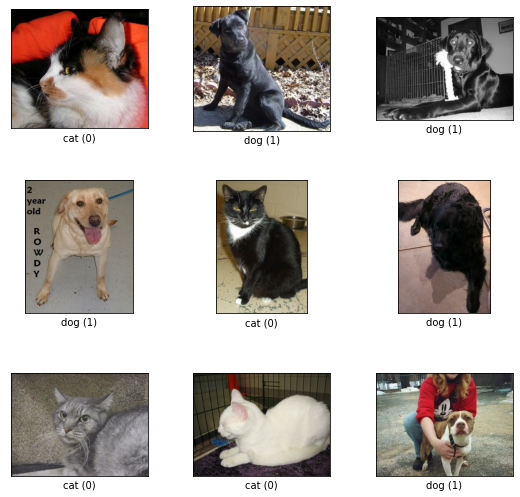

In [36]:
fig = tfds.show_examples(ds_train, ds_info)

In [19]:
BATCH_SIZE = 512
EPOCHS = 10

In [38]:

datasets = []

for ds in [ds_train, ds_valid, ds_test]:
    datasets.append(apply_normalize_on_dataset(ds, batch_size=BATCH_SIZE))

ds_train, ds_valid, ds_test = tuple(datasets)

Tensor("args_0:0", shape=(None, None, 3), dtype=uint8)
Tensor("args_0:0", shape=(None, None, 3), dtype=uint8)
Tensor("args_0:0", shape=(None, None, 3), dtype=uint8)


In [39]:
keras.__version__

'2.6.0'

resnet_34


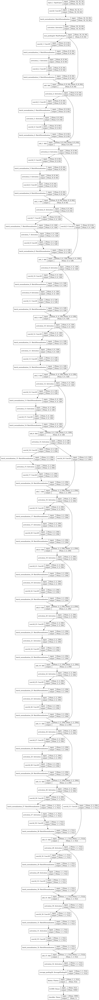

resnet_50


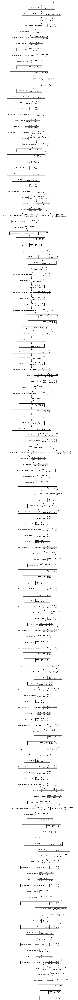

plainnet_34


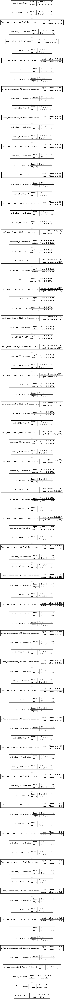

plainnet_50


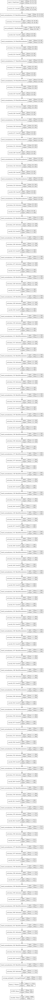

In [40]:
# from keras.utils import plot_model
from keras.utils.vis_utils import plot_model

model_list = [resnet_34, resnet_50, plainnet_34, plainnet_50]
model_name = ['resnet_34', 'resnet_50', 'plainnet_34', 'plainnet_50']
for model, name in zip(model_list, model_name) :
    print(name)
    display(plot_model(model, show_shapes=True))


# Train each models

In [41]:
import warnings
warnings.filterwarnings('ignore')

In [42]:
%%time

histories = {}

for model, name in zip(model_list, model_name) :
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001, clipnorm=1.),
        loss=keras.losses.BinaryCrossentropy(from_logits=False), # 분류기에 softmax여부에 따른 옵션
        metrics=['accuracy'],
    )

    history = model.fit(
        ds_train,
        steps_per_epoch=int(ds_info.splits['train'].num_examples*0.8/BATCH_SIZE),
        validation_steps=int(ds_info.splits['train'].num_examples*0.1/BATCH_SIZE),
        epochs=EPOCHS,
        validation_data=ds_valid,
        verbose=1,
        use_multiprocessing=True
    )

    histories[f"{name}"] = history

Epoch 1/10


Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd

 5/36 [===>..........................] - ETA: 24s - loss: 12.9324 - accuracy: 0.4969

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


18/36 [==============>...............] - ETA: 9s - loss: 5.2174 - accuracy: 0.5545 

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 8s - loss: 5.0457 - accuracy: 0.5588

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 8s - loss: 4.8902 - accuracy: 0.5630

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 7s - loss: 4.7502 - accuracy: 0.5658

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


35/36 [============================>.] - ETA: 0s - loss: 3.5893 - accuracy: 0.6048

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 3.5390 - accuracy: 0.6071

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0x

36/36 [==============================] - 230s 3s/step - loss: 3.5390 - accuracy: 0.6071 - val_loss: 128.2369 - val_accuracy: 0.4731
Epoch 2/10
 6/36 [====>.........................] - ETA: 7s - loss: 1.8075 - accuracy: 0.6683

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 6s - loss: 1.8255 - accuracy: 0.6716

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 6s - loss: 1.8232 - accuracy: 0.6739

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 1.8223 - accuracy: 0.6712

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 1.8225 - accuracy: 0.6725

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.7709 - accuracy: 0.6840

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd

36/36 [==============================] - 96s 3s/step - loss: 1.7709 - accuracy: 0.6840 - val_loss: 1.8780 - val_accuracy: 0.4928


Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


Epoch 3/10
 7/36 [====>.........................] - ETA: 4s - loss: 1.6232 - accuracy: 0.7246

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 5s - loss: 1.6141 - accuracy: 0.7216

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 1.6113 - accuracy: 0.7227

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 1.6099 - accuracy: 0.7233

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 4s - loss: 1.6083 - accuracy: 0.7243

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.5862 - accuracy: 0.7350

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 97s 3s/step - loss: 1.5862 - accuracy: 0.7350 - val_loss: 1.8567 - val_accuracy: 0.5072
Epoch 4/10
 1/36 [..............................] - ETA: 5s - loss: 1.5865 - accuracy: 0.7246

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 4s - loss: 1.4569 - accuracy: 0.7825

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 3s - loss: 1.4589 - accuracy: 0.7801

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 3s - loss: 1.4511 - accuracy: 0.7842

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 3s - loss: 1.4483 - accuracy: 0.7859

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.4318 - accuracy: 0.7950

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 98s 3s/step - loss: 1.4318 - accuracy: 0.7950 - val_loss: 1.6933 - val_accuracy: 0.5323
Epoch 5/10
 1/36 [..............................] - ETA: 5s - loss: 1.4358 - accuracy: 0.7734

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 1s - loss: 1.3556 - accuracy: 0.8010

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 1s - loss: 1.3478 - accuracy: 0.8049

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 1s - loss: 1.3426 - accuracy: 0.8079

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


25/36 [===================>..........] - ETA: 1s - loss: 1.3429 - accuracy: 0.8077

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.3107 - accuracy: 0.8213

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 99s 3s/step - loss: 1.3107 - accuracy: 0.8213 - val_loss: 2.0877 - val_accuracy: 0.5196
Epoch 6/10
 1/36 [..............................] - ETA: 5s - loss: 1.2362 - accuracy: 0.8477

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


35/36 [============================>.] - ETA: 0s - loss: 1.2225 - accuracy: 0.8461

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.2183 - accuracy: 0.8474

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0x

36/36 [==============================] - 93s 3s/step - loss: 1.2183 - accuracy: 0.8474 - val_loss: 2.3498 - val_accuracy: 0.5013
Epoch 7/10
36/36 [==============================] - ETA: 0s - loss: 1.1070 - accuracy: 0.8664

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 1.1070 - accuracy: 0.8664 - val_loss: 1.5918 - val_accuracy: 0.6108
Epoch 8/10
36/36 [==============================] - ETA: 0s - loss: 1.0003 - accuracy: 0.8999

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 1.0003 - accuracy: 0.8999 - val_loss: 2.1458 - val_accuracy: 0.5684
Epoch 9/10
36/36 [==============================] - ETA: 0s - loss: 0.9155 - accuracy: 0.9162

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 0.9155 - accuracy: 0.9162 - val_loss: 1.8422 - val_accuracy: 0.6382
Epoch 10/10
36/36 [==============================] - ETA: 0s - loss: 0.8233 - accuracy: 0.9368

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 0.8233 - accuracy: 0.9368 - val_loss: 2.8462 - val_accuracy: 0.5243
Epoch 1/10


Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd

 5/36 [===>..........................] - ETA: 7s - loss: 7.2569 - accuracy: 0.4973

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


18/36 [==============>...............] - ETA: 7s - loss: 4.7778 - accuracy: 0.5205

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 7s - loss: 4.6762 - accuracy: 0.5223

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 6s - loss: 4.5803 - accuracy: 0.5255

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 6s - loss: 4.4998 - accuracy: 0.5282

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


35/36 [============================>.] - ETA: 0s - loss: 3.7882 - accuracy: 0.5491

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 3.7559 - accuracy: 0.5497

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0x

36/36 [==============================] - 195s 3s/step - loss: 3.7559 - accuracy: 0.5497 - val_loss: 8.8080 - val_accuracy: 0.4722
Epoch 2/10
 6/36 [====>.........................] - ETA: 2s - loss: 2.6508 - accuracy: 0.5892

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 5s - loss: 2.6201 - accuracy: 0.6234

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 5s - loss: 2.6136 - accuracy: 0.6266

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 2.6098 - accuracy: 0.6284

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 2.6062 - accuracy: 0.6310

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.5666 - accuracy: 0.6567

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 97s 3s/step - loss: 2.5666 - accuracy: 0.6567 - val_loss: 2.8101 - val_accuracy: 0.5193
Epoch 3/10
20/36 [===============>..............] - ETA: 4s - loss: 2.4561 - accuracy: 0.7009

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 4s - loss: 2.4463 - accuracy: 0.7083

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 3s - loss: 2.4402 - accuracy: 0.7116

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 3s - loss: 2.4425 - accuracy: 0.7110

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.4067 - accuracy: 0.7306

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 98s 3s/step - loss: 2.4067 - accuracy: 0.7306 - val_loss: 2.7449 - val_accuracy: 0.4961
Epoch 4/10
21/36 [================>.............] - ETA: 1s - loss: 2.2701 - accuracy: 0.8125

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 1s - loss: 2.2706 - accuracy: 0.8110

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 1s - loss: 2.2717 - accuracy: 0.8103

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


25/36 [===================>..........] - ETA: 1s - loss: 2.2694 - accuracy: 0.8109

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.2504 - accuracy: 0.8169

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 98s 3s/step - loss: 2.2504 - accuracy: 0.8169 - val_loss: 2.7487 - val_accuracy: 0.5154
Epoch 5/10
36/36 [==============================] - ETA: 0s - loss: 2.2571 - accuracy: 0.7878

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 2.2571 - accuracy: 0.7878 - val_loss: 2.8523 - val_accuracy: 0.5139
Epoch 6/10
36/36 [==============================] - ETA: 0s - loss: 2.1122 - accuracy: 0.8427

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 2.1122 - accuracy: 0.8427 - val_loss: 2.5084 - val_accuracy: 0.5957
Epoch 7/10
36/36 [==============================] - ETA: 0s - loss: 2.0175 - accuracy: 0.8743

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 2.0175 - accuracy: 0.8743 - val_loss: 2.7745 - val_accuracy: 0.6108
Epoch 8/10
36/36 [==============================] - ETA: 0s - loss: 1.9000 - accuracy: 0.8995

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 1.9000 - accuracy: 0.8995 - val_loss: 2.6144 - val_accuracy: 0.6968
Epoch 9/10
36/36 [==============================] - ETA: 0s - loss: 1.8552 - accuracy: 0.9070

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 1.8552 - accuracy: 0.9070 - val_loss: 2.4463 - val_accuracy: 0.6494
Epoch 10/10
36/36 [==============================] - ETA: 0s - loss: 1.7628 - accuracy: 0.9250

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 1.7628 - accuracy: 0.9250 - val_loss: 2.6611 - val_accuracy: 0.6692
Epoch 1/10


Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd

 1/36 [..............................] - ETA: 53:29 - loss: 2.3300 - accuracy: 0.4844

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


 5/36 [===>..........................] - ETA: 13s - loss: 2.5884 - accuracy: 0.4910

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


18/36 [==============>...............] - ETA: 7s - loss: 2.1777 - accuracy: 0.5023

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 7s - loss: 2.1611 - accuracy: 0.5051

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 7s - loss: 2.1472 - accuracy: 0.5060

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 6s - loss: 2.1181 - accuracy: 0.5139

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


35/36 [============================>.] - ETA: 0s - loss: 1.9795 - accuracy: 0.5586

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.9714 - accuracy: 0.5605

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0x

36/36 [==============================] - 189s 3s/step - loss: 1.9714 - accuracy: 0.5605 - val_loss: 10.6200 - val_accuracy: 0.5033
Epoch 2/10
 1/36 [..............................] - ETA: 6s - loss: 1.6911 - accuracy: 0.6230

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


 6/36 [====>.........................] - ETA: 7s - loss: 1.6657 - accuracy: 0.6589

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 6s - loss: 1.6341 - accuracy: 0.6764

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 6s - loss: 1.6320 - accuracy: 0.6765

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 6s - loss: 1.6368 - accuracy: 0.6718

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 1.6371 - accuracy: 0.6717

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.6219 - accuracy: 0.6737

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd

36/36 [==============================] - 96s 3s/step - loss: 1.6219 - accuracy: 0.6737 - val_loss: 2.1133 - val_accuracy: 0.4967
Epoch 3/10
 7/36 [====>.........................] - ETA: 4s - loss: 1.5854 - accuracy: 0.6710

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 5s - loss: 1.5359 - accuracy: 0.7103

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 1.5343 - accuracy: 0.7118

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 1.5337 - accuracy: 0.7114

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 4s - loss: 1.5314 - accuracy: 0.7130

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.5082 - accuracy: 0.7269

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 96s 3s/step - loss: 1.5082 - accuracy: 0.7269 - val_loss: 1.6454 - val_accuracy: 0.5287
Epoch 4/10
 1/36 [..............................] - ETA: 5s - loss: 1.4939 - accuracy: 0.7227

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 4s - loss: 1.4285 - accuracy: 0.7476

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 4s - loss: 1.4305 - accuracy: 0.7452

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 3s - loss: 1.4285 - accuracy: 0.7469

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 3s - loss: 1.4284 - accuracy: 0.7454

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


26/36 [====================>.........] - ETA: 3s - loss: 1.4277 - accuracy: 0.7449

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.4139 - accuracy: 0.7507

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 97s 3s/step - loss: 1.4139 - accuracy: 0.7507 - val_loss: 1.5367 - val_accuracy: 0.6289
Epoch 5/10
 1/36 [..............................] - ETA: 5s - loss: 1.3678 - accuracy: 0.7656

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 1s - loss: 1.3344 - accuracy: 0.7780

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 1s - loss: 1.3291 - accuracy: 0.7812

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 1s - loss: 1.3253 - accuracy: 0.7836

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


25/36 [===================>..........] - ETA: 1s - loss: 1.3219 - accuracy: 0.7856

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.2973 - accuracy: 0.7980

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 99s 3s/step - loss: 1.2973 - accuracy: 0.7980 - val_loss: 1.4489 - val_accuracy: 0.6436
Epoch 6/10
 1/36 [..............................] - ETA: 6s - loss: 1.2971 - accuracy: 0.7930

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.2224 - accuracy: 0.8087

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 1.2224 - accuracy: 0.8087 - val_loss: 1.7910 - val_accuracy: 0.5322
Epoch 7/10
36/36 [==============================] - ETA: 0s - loss: 1.1149 - accuracy: 0.8432

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 1.1149 - accuracy: 0.8432 - val_loss: 3.0355 - val_accuracy: 0.5270
Epoch 8/10
 1/36 [..............................] - ETA: 6s - loss: 1.0411 - accuracy: 0.8652

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 1.0257 - accuracy: 0.8728

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 1.0257 - accuracy: 0.8728 - val_loss: 1.8644 - val_accuracy: 0.6323
Epoch 9/10
36/36 [==============================] - ETA: 0s - loss: 0.9503 - accuracy: 0.8864

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 0.9503 - accuracy: 0.8864 - val_loss: 2.9768 - val_accuracy: 0.5439
Epoch 10/10
 1/36 [..............................] - ETA: 5s - loss: 0.9307 - accuracy: 0.8926

Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 0.8625 - accuracy: 0.9078

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 93s 3s/step - loss: 0.8625 - accuracy: 0.9078 - val_loss: 3.9825 - val_accuracy: 0.5943
Epoch 1/10


Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd

 1/36 [..............................] - ETA: 55:09 - loss: 3.0435 - accuracy: 0.5195

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


 5/36 [===>..........................] - ETA: 13s - loss: 3.2717 - accuracy: 0.5055

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


18/36 [==============>...............] - ETA: 8s - loss: 2.9696 - accuracy: 0.4985

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 7s - loss: 2.9544 - accuracy: 0.4984

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 7s - loss: 2.9405 - accuracy: 0.4968

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 6s - loss: 2.9275 - accuracy: 0.4955

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


35/36 [============================>.] - ETA: 0s - loss: 2.7823 - accuracy: 0.4981

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.7744 - accuracy: 0.4986

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0x

36/36 [==============================] - 191s 3s/step - loss: 2.7744 - accuracy: 0.4986 - val_loss: 2.4734 - val_accuracy: 0.5083
Epoch 2/10
 6/36 [====>.........................] - ETA: 7s - loss: 2.4718 - accuracy: 0.4961

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


19/36 [==============>...............] - ETA: 6s - loss: 2.4503 - accuracy: 0.4964

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 6s - loss: 2.4487 - accuracy: 0.4972

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 2.4469 - accuracy: 0.4964

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 2.4452 - accuracy: 0.4973

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.4288 - accuracy: 0.4964

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd

36/36 [==============================] - 95s 3s/step - loss: 2.4288 - accuracy: 0.4964 - val_loss: 2.3911 - val_accuracy: 0.5269
Epoch 3/10
 7/36 [====>.........................] - ETA: 4s - loss: 2.3912 - accuracy: 0.5173

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


20/36 [===============>..............] - ETA: 5s - loss: 2.3823 - accuracy: 0.5135

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


21/36 [================>.............] - ETA: 5s - loss: 2.3816 - accuracy: 0.5134

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 5s - loss: 2.3812 - accuracy: 0.5139

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 4s - loss: 2.3801 - accuracy: 0.5129

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.3728 - accuracy: 0.5163

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 97s 3s/step - loss: 2.3728 - accuracy: 0.5163 - val_loss: 2.3511 - val_accuracy: 0.4879
Epoch 4/10
21/36 [================>.............] - ETA: 4s - loss: 2.3411 - accuracy: 0.5232

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


22/36 [=================>............] - ETA: 3s - loss: 2.3411 - accuracy: 0.5239

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 3s - loss: 2.3409 - accuracy: 0.5266

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 3s - loss: 2.3398 - accuracy: 0.5266

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.3309 - accuracy: 0.5346

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 97s 3s/step - loss: 2.3309 - accuracy: 0.5346 - val_loss: 2.6680 - val_accuracy: 0.5447
Epoch 5/10
22/36 [=================>............] - ETA: 1s - loss: 2.2981 - accuracy: 0.5478

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


23/36 [==================>...........] - ETA: 1s - loss: 2.2967 - accuracy: 0.5494

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


24/36 [===================>..........] - ETA: 1s - loss: 2.2961 - accuracy: 0.5488

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


25/36 [===================>..........] - ETA: 1s - loss: 2.2951 - accuracy: 0.5490

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


36/36 [==============================] - ETA: 0s - loss: 2.2842 - accuracy: 0.5573

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 98s 3s/step - loss: 2.2842 - accuracy: 0.5573 - val_loss: 2.5374 - val_accuracy: 0.5195
Epoch 6/10
36/36 [==============================] - ETA: 0s - loss: 2.2021 - accuracy: 0.6225

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 2.2021 - accuracy: 0.6225 - val_loss: 3.8252 - val_accuracy: 0.5067
Epoch 7/10
36/36 [==============================] - ETA: 0s - loss: 2.1406 - accuracy: 0.6579

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 2.1406 - accuracy: 0.6579 - val_loss: 2.9327 - val_accuracy: 0.4917
Epoch 8/10
36/36 [==============================] - ETA: 0s - loss: 2.0798 - accuracy: 0.6657

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 2.0798 - accuracy: 0.6657 - val_loss: 2.1159 - val_accuracy: 0.5078
Epoch 9/10
36/36 [==============================] - ETA: 0s - loss: 2.0115 - accuracy: 0.6886

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 91s 3s/step - loss: 2.0115 - accuracy: 0.6886 - val_loss: 2.0658 - val_accuracy: 0.5879
Epoch 10/10
36/36 [==============================] - ETA: 0s - loss: 1.9658 - accuracy: 0.6823

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9

36/36 [==============================] - 92s 3s/step - loss: 1.9658 - accuracy: 0.6823 - val_loss: 2.3786 - val_accuracy: 0.5664
CPU times: user 2h 45min 28s, sys: 9min 56s, total: 2h 55min 24s
Wall time: 1h 10min 12s


In [ ]:
# Save / Export the history

## 시각화

학습을 통해 만들어진 history를 matplotlib로 시각화하여 두 모델의 검증 정확도(validation accuracy)와 검증 손실(validation loss)이 어떻게 다른지 살펴봅시다.


In [43]:
import matplotlib.pyplot as plt

def plot_history(history):
    # 훈련 손실과 검증 손실을 서브플롯에 그림
    plt.figure(figsize=(12, 6))

    # 첫 번째 서브플롯: 손실
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss Over Epochs')
    plt.legend()

    # 두 번째 서브플롯: 정확도
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Over Epochs')
    plt.legend()

    plt.tight_layout()
    plt.show()

Result of Model : f{name}


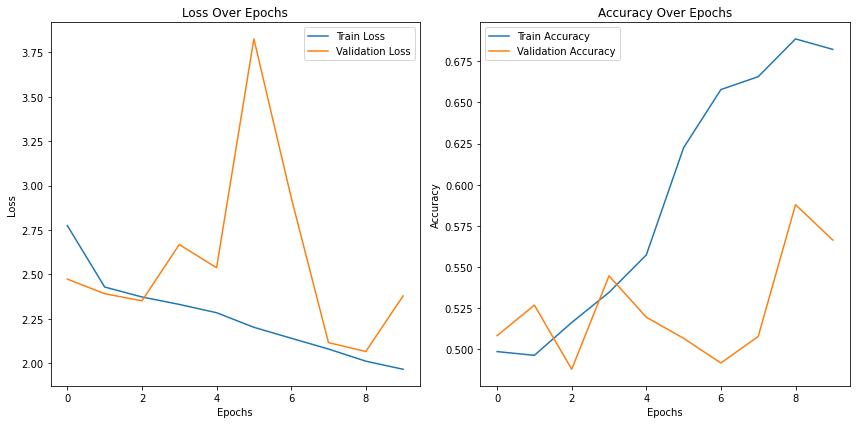

None

In [45]:
for name, history in histories.items():
    print(f"Result of Model : {name}")
    display(plot_history(history))

In [46]:
histories

{'f{name}': <keras.callbacks.History at 0x7b4fc05d0130>}

# f-string을 잘못지정해서, 1개의 결과밖에 저장이 되지 않음.
- image데이터를 사전에 솎아낼 수 있다면 좋을텐데, 생각보다 잘 안된다. 

In [58]:
def is_valid_image(image, label):
    try:
        if tf.rank(image) == 3:
            # Image is already decoded, check if it's valid
            if tf.shape(image)[-1] not in [1, 3, 4]:
                return False
            # Re-encode to JPEG to check validity
            image = tf.io.encode_jpeg(image)
        
        # Now decode the image (whether it was originally encoded or we just encoded it)
        tf.io.decode_jpeg(image, channels=3)
        return True
    except tf.errors.InvalidArgumentError as e:
        print(f"Error processing image: {str(e)}")
        return False


In [53]:
# import os

# def create_corrupt_jpeg():
#     # Create a file with some random data
#     with open('corrupt.jpg', 'wb') as f:
#         f.write(b'\xff\xd8')  # JPEG SOI marker
#         f.write(os.urandom(1000))  # Random data
#     return 'corrupt.jpg'

# # Create a corrupt JPEG file
# corrupt_file = create_corrupt_jpeg()

# # Read the corrupt image file
# with open(corrupt_file, 'rb') as f:
#     corrupt_image_data = f.read()

# # Test the is_valid_image function
# is_valid = is_valid_image(corrupt_image_data, 0)  # 0 is a dummy label
# print(f"Is the image valid? {is_valid}")

# # Clean up
# os.remove(corrupt_file)

Is the image valid? False


In [54]:
# def create_specific_corrupt_jpeg():
#     with open('specific_corrupt.jpg', 'wb') as f:
#         f.write(b'\xff\xd8\xff\xe0')  # JPEG SOI and APP0 markers
#         f.write(b'\x00\x10')  # Length of APP0 segment
#         f.write(b'JFIF\x00')  # JFIF identifier
#         f.write(b'\x01\x01')  # Version
#         f.write(b'\x00')  # Units
#         f.write(b'\x00\x01\x00\x01')  # Density
#         f.write(b'\x00\x00')  # Thumbnail
#         f.write(b'\x00' * 1000)  # Extraneous bytes
#     return 'specific_corrupt.jpg'

# specific_corrupt_file = create_specific_corrupt_jpeg()

# # Read and test the specifically corrupted image
# with open(specific_corrupt_file, 'rb') as f:
#     specific_corrupt_image_data = f.read()

# is_valid = is_valid_image(specific_corrupt_image_data, 0)
# print(f"Is the specifically corrupted image valid? {is_valid}")

# # Clean up
# os.remove(specific_corrupt_file)

Is the specifically corrupted image valid? False


Input file read error


In [55]:
import tensorflow as tf
import tensorflow_datasets as tfds

def is_valid_image(image, label):
    shape = tf.shape(image)
    height, width, channels = shape[0], shape[1], shape[2]
    is_valid = tf.logical_and(
        tf.logical_and(height > 0, width > 0),
        tf.equal(channels, 3)
    )
    return is_valid

def prepare_dataset(ds, batch_size):
    # Filter out invalid images
    ds = ds.filter(is_valid_image)
    
    # Preprocess images
    def preprocess(image, label):
        # Convert to float and normalize
        image = tf.cast(image, tf.float32) / 255.0
        
        # Resize the image
        image = tf.image.resize(image, [224, 224])
        
        return image, label

    # Apply preprocessing
    ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    
    # Batch and prefetch
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

In [56]:
(ds_train, ds_valid, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]','train[80%:90%]', 'train[90%:]'],
    as_supervised=True,
    shuffle_files=True,
    with_info=True,
)

In [57]:
ds_train

<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

In [58]:
datasets = []

for ds in [ds_train, ds_valid, ds_test]:
#     datasets.append(apply_normalize_on_dataset(ds, batch_size=BATCH_SIZE))
    datasets.append(prepare_dataset(ds, batch_size=BATCH_SIZE))

ds_train, ds_valid, ds_test = tuple(datasets)

In [59]:
sum([1 for _ in ds_train])

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582

In [60]:
sum([1 for _ in ds_valid])

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


73

In [61]:
sum([1 for _ in ds_test])

Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9


73

## 추가 실험

시간이 남으면 아래 카탈로그를 보고, tensorflow-datasets의 지원하는 다른 데이터셋에 실험을 해봅시다.

[Tensorflow Datasets](https://www.tensorflow.org/datasets/catalog/overview)


In [62]:
import tensorflow as tf
import tensorflow_datasets as tfds

def is_valid_image(image, label):
    # Check if the image has valid dimensions and 3 channels
    shape = tf.shape(image)
    is_valid = tf.logical_and(
        tf.logical_and(shape[0] > 0, shape[1] > 0),
        tf.equal(shape[2], 3)
    )
    # Check if the image contains any invalid values
    is_valid = tf.logical_and(
        is_valid,
        tf.reduce_all(tf.logical_and(tf.greater_equal(image, 0), tf.less_equal(image, 255)))
    )
    return is_valid

def prepare_dataset(ds, batch_size):
    # Filter out invalid images
    ds = ds.filter(is_valid_image)
    
    # Preprocess images
    def preprocess(image, label):
        # Convert to float and normalize
        image = tf.cast(image, tf.float32) / 255.0
        
        # Resize the image
        image = tf.image.resize(image, [224, 224])
        
        return image, label

    # Apply preprocessing
    ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    
    # Batch and prefetch
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

# Load your datasets
(ds_train, ds_valid, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]','train[80%:90%]', 'train[90%:]'],
    as_supervised=True,
    shuffle_files=True,
    with_info=True,
)


BATCH_SIZE = 32  # Adjust as needed

# Prepare datasets
datasets = []
for ds in [ds_train, ds_valid, ds_test]:
    datasets.append(prepare_dataset(ds, batch_size=BATCH_SIZE))

ds_train, ds_valid, ds_test = tuple(datasets)

In [63]:
next(iter(ds_train))

(<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
 array([[[[0.03301821, 0.03693978, 0.00556723],
          [0.02846639, 0.03238796, 0.00101541],
          [0.01607143, 0.019993  , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],
 
         [[0.03301821, 0.03693978, 0.00556723],
          [0.02846639, 0.03238796, 0.00101541],
          [0.01607143, 0.019993  , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],
 
         [[0.03301821, 0.03693978, 0.00556723],
          [0.02846639, 0.03238796, 0.00101541],
          [0.01607143, 0.019993  , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],
 
         ...,
 
      

In [34]:
# Updated function to count elements in a dataset
def count_elements(dataset):
    count = 0
    for images, labels in dataset:
        count += images.shape[0]  # Add the batch size
    return count

# Check the size of each dataset after filtering
print(f"Train dataset size: {count_elements(ds_train)}")
print(f"Validation dataset size: {count_elements(ds_valid)}")
print(f"Test dataset size: {count_elements(ds_test)}")

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


Train dataset size: 18610


Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


Validation dataset size: 2326


Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9


Test dataset size: 2326


---

In [64]:
INPUT_SHAPE = (224, 224, 3)

def get_models(input_shape):
    model_list = []
    
    model_list.append(ResnetBuilder.build_resnet_34(input_shape, 1, is_resnet=True))
    model_list.append(ResnetBuilder.build_resnet_50(input_shape, 1, is_resnet=True))
    model_list.append(ResnetBuilder.build_resnet_34(input_shape, 1, is_resnet=False))
    model_list.append(ResnetBuilder.build_resnet_50(input_shape, 1, is_resnet=False))
    
    return model_list

In [65]:
new_model_list = get_models(INPUT_SHAPE)
new_model_name = ['resnet_34', 'resnet_50', 'plainnet_34', 'plainnet_50']

In [67]:
new_model_list[0].summary()

Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_510 (Conv2D)             (None, 112, 112, 64) 9472        input_13[0][0]                   
__________________________________________________________________________________________________
batch_normalization_492 (BatchN (None, 112, 112, 64) 256         conv2d_510[0][0]                 
__________________________________________________________________________________________________
activation_492 (Activation)     (None, 112, 112, 64) 0           batch_normalization_492[0][0]    
___________________________________________________________________________________________

In [66]:
%%time

histories = {}

for model, name in zip(model_list, model_name) :
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001, clipnorm=1.),
        loss=keras.losses.BinaryCrossentropy(from_logits=False), # 분류기에 softmax여부에 따른 옵션
        metrics=['accuracy'],
    )

    history = model.fit(
        ds_train,
        steps_per_epoch=int(ds_info.splits['train'].num_examples*0.8/BATCH_SIZE),
        validation_steps=int(ds_info.splits['train'].num_examples*0.1/BATCH_SIZE),
        epochs=EPOCHS,
        validation_data=ds_valid,
        verbose=1,
        use_multiprocessing=True
    )

    histories[f"{name}"] = history

Epoch 1/10


ValueError: in user code:

    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:853 train_function  *
        return step_function(self, iterator)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:842 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:835 run_step  **
        outputs = model.train_step(data)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:787 train_step
        y_pred = self(x, training=True)
    /opt/conda/lib/python3.9/site-packages/keras/engine/base_layer.py:1020 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    /opt/conda/lib/python3.9/site-packages/keras/engine/input_spec.py:266 assert_input_compatibility
        raise ValueError('Input ' + str(input_index) +

    ValueError: Input 0 is incompatible with layer model: expected shape=(None, 32, 32, 3), found shape=(None, 224, 224, 3)


# 회고

- 모듈화해서 아키텍쳐를 짜는 과정은 흥미롭다.

- Resnet 34 및 50을 아키텍쳐만 보고 구현을 해보고 싶어 고민을 너무 많이 한 것 같음.
- 고민을 하다가 보니 추가 데이터셋에 대한 실험을 진행하지 못하였음.

- (32, 32)로는 데이터의 특성을 잘 포착하지 못하는 것 같음
- (214, 214)로 진행하고 싶으나, 약 1700여개의 데이터셋의 Corruption으로 인한 학습속도 지연이 아쉬움